In [1]:
#filename = "data_test.txt"
filename = "data.txt"
#filename = "data_test1.txt"

In [2]:
with open(filename,"r") as f:
    lines = f.read().splitlines()

In [3]:
lines

['9165985876154699219988192797299938946759548993842382179897895847959995468789384779887969965834298757',
 '9998264799399739852669159899969915752881369928979589425659869512849898348591988899941938989958981368',
 '8899439372928798295981284899995498957198997822776999766989269673341115866632499916582179985999797178',
 '9421373314798816327241583824298987799745811978869899899899999689988933652499891999899718759652641398',
 '9949959989598519929632977671926983547787167773939739198988988851889519228348573848979828599971727943',
 '2989192448779756984992587956689999842746119939998567894718899918799954281648927282191699499764931166',
 '9536499426969676189784443598979559899499773119978188394689557995599331996979736693529419681251956996',
 '1751936936954979779895998917863998697858138691879749999727789764741997539275579593798975539798818972',
 '7274746616894977772987689459988988891794769772199789185982726479992789563994126143759648659653627929',
 '97682111786492699959234939121769686666799998598299138

In [4]:
#Plan,

#Start from end
# Iterate for points around it (up and left)
# As moving towards left and up, check the calculated risk for going right or down
# and store direction (down or right) that gives minimum risk.

In [5]:
#Convert data to array of ints
data=[]
for l in lines:
    data0=[]
    for i in range(len(l)):
        c = l[i]
        data0.append(int(c))
    data.append(data0)


In [6]:
import numpy as np
data_np = np.array(data, dtype=np.int8)

In [7]:
data_np

array([[9, 1, 6, ..., 7, 5, 7],
       [9, 9, 9, ..., 3, 6, 8],
       [8, 8, 9, ..., 1, 7, 8],
       ...,
       [9, 3, 6, ..., 7, 7, 9],
       [1, 6, 5, ..., 1, 9, 9],
       [9, 7, 8, ..., 9, 3, 7]], dtype=int8)

In [8]:
best_risk_from_bottom_right = np.zeros_like(data_np, dtype=np.int32)

In [9]:
best_dir = np.zeros_like(data_np) # 0 for down, 1 for right

In [10]:
class IterFromBottomRight:
    ''' Iterates coordinates from bottom right including the corner element
    '''

    ix=None
    iy=None
    includeBRCorner = False

    def get_diag(self):
        return (self.sizex+self.sizey-2) - self.ix-self.iy

    def __init__(self, shape):
        self.sizey, self.sizex = shape

    def __iter__(self):

        return self

    def __next__(self):
        #first element?
        if self.ix is None:
            self.ix = self.sizex-1
            self.iy = self.sizey-1

        # Next iteration

        cur_diag = self.get_diag()
        self.ix += 1
        #diag = (self.sizex+self.sizey-2) - self.ix-self.iy
        temp0 = (self.sizex+self.sizey-2) - cur_diag
        self.iy = temp0 - self.ix

        if self.ix >= self.sizex or self.iy<0:
            #print(f"new ix {ix} is >= sizex or iy={iy}<0")
            #print("Next diagonal")
            # off limit, got to next diagonal
            cur_diag += 1

            #Try starting at the bottom
            self.iy = self.sizey-1
            temp0 = (self.sizex+self.sizey-2) - cur_diag
            self.ix = temp0-self.iy

            if self.ix<0: #off limit, start at the left side instead
                #print("ix off grid")
                self.ix=0
                self.iy = temp0 - self.ix
                if self.iy<0:
                    #print("Complete")
                    raise StopIteration #Should stop at next iteration, not here!

        
        return self.iy, self.ix, self.get_diag()


In [11]:
#Do one initial cycle
myiter = IterFromBottomRight(data_np.shape)
yx_iter = iter( IterFromBottomRight(data_np.shape) )

In [12]:
sizey, sizex = data_np.shape

for iy,ix,idiag in yx_iter:
    print(f"iy,ix,idiag = {iy},{ix},{idiag}")
    #What is the risk from here?
    
    riskdown=None
    riskright = None
    bestdir0 = None #1 - right, 2 - down #3 for left # 4 - up
    
    #down
    iy1 = iy+1
    if iy1 < sizey:
        riskdown = data_np[iy1,ix] + best_risk_from_bottom_right[iy1,ix]
    #right
    ix1 = ix+1
    if ix1<sizex:
        riskright = data_np[iy,ix1] + best_risk_from_bottom_right[iy,ix1]
    
    if riskdown is None:
        risk=riskright
        bestdir0 = 1
    elif riskright is None:
        risk=riskdown
        bestdir0= 2
    elif riskdown<riskright:
        risk = riskdown
        bestdir0 = 2
    else:
        risk=riskright
        bestdir0=1
    
    best_risk_from_bottom_right[iy,ix] = risk
    best_dir[iy,ix]= bestdir0

iy,ix,idiag = 99,98,1
iy,ix,idiag = 98,99,1
iy,ix,idiag = 99,97,2
iy,ix,idiag = 98,98,2
iy,ix,idiag = 97,99,2
iy,ix,idiag = 99,96,3
iy,ix,idiag = 98,97,3
iy,ix,idiag = 97,98,3
iy,ix,idiag = 96,99,3
iy,ix,idiag = 99,95,4
iy,ix,idiag = 98,96,4
iy,ix,idiag = 97,97,4
iy,ix,idiag = 96,98,4
iy,ix,idiag = 95,99,4
iy,ix,idiag = 99,94,5
iy,ix,idiag = 98,95,5
iy,ix,idiag = 97,96,5
iy,ix,idiag = 96,97,5
iy,ix,idiag = 95,98,5
iy,ix,idiag = 94,99,5
iy,ix,idiag = 99,93,6
iy,ix,idiag = 98,94,6
iy,ix,idiag = 97,95,6
iy,ix,idiag = 96,96,6
iy,ix,idiag = 95,97,6
iy,ix,idiag = 94,98,6
iy,ix,idiag = 93,99,6
iy,ix,idiag = 99,92,7
iy,ix,idiag = 98,93,7
iy,ix,idiag = 97,94,7
iy,ix,idiag = 96,95,7
iy,ix,idiag = 95,96,7
iy,ix,idiag = 94,97,7
iy,ix,idiag = 93,98,7
iy,ix,idiag = 92,99,7
iy,ix,idiag = 99,91,8
iy,ix,idiag = 98,92,8
iy,ix,idiag = 97,93,8
iy,ix,idiag = 96,94,8
iy,ix,idiag = 95,95,8
iy,ix,idiag = 94,96,8
iy,ix,idiag = 93,97,8
iy,ix,idiag = 92,98,8
iy,ix,idiag = 91,99,8
iy,ix,idiag = 99,90,9
iy,ix,idia

In [13]:
best_dir

array([[1, 2, 1, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [1, 2, 2, ..., 2, 2, 2],
       ...,
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 1, 2, 2],
       [1, 1, 1, ..., 1, 1, 0]], dtype=int8)

In [14]:
best_risk_from_bottom_right

array([[756, 755, 750, ..., 555, 607, 612],
       [754, 746, 743, ..., 552, 601, 604],
       [746, 738, 734, ..., 551, 594, 596],
       ...,
       [587, 584, 578, ...,  20,  19,  16],
       [587, 581, 576, ...,  19,  10,   7],
       [654, 647, 639, ...,  10,   7,   0]])

In [15]:
#not working, probably because im discarding movements to left and up

In [16]:
#Now iterate a optmization procedure until no change occurs

#myiter1 = IterFromBottomRight(data_np.shape)
#yx_iter1 = iter( myiter1 )

hasChanged=True
while hasChanged:
    myiter1 = IterFromBottomRight(data_np.shape)
    yx_iter1 = iter( myiter1 )

    hasChanged=False
    for iy,ix,idiag in yx_iter1:
        
        newrisk = None
        newdir = None #1 - right, 2 - down , 3 for left , 4 - up

        cur_risk = best_risk_from_bottom_right[iy,ix]

        print(f"{iy},{ix} : cur_risk = {cur_risk}")

        #Check all directions for a potential better route
        #down
        iy1 = iy+1
        if iy1 < sizey:
            risk0 = data_np[iy1,ix] + best_risk_from_bottom_right[iy1,ix]
            if risk0 < cur_risk:
                print("better risk going down")
                newrisk = risk0
                newdir = 2

        #right
        ix1 = ix+1
        if ix1<sizex:
            risk0 = data_np[iy,ix1] + best_risk_from_bottom_right[iy,ix1]
            if risk0 < cur_risk:
                print("better risk going right")
                newrisk = risk0
                newdir = 1
        
        #up
        iy1 = iy-1
        if iy1 >=0 :
            risk0 = data_np[iy1,ix] + best_risk_from_bottom_right[iy1,ix]
            if risk0 < cur_risk:
                print("better risk going up")
                newrisk = risk0
                newdir = 4
        
        #left
        ix1 = ix-1
        if ix1>=0:
            risk0 = data_np[iy,ix1] + best_risk_from_bottom_right[iy,ix1]
            if risk0 < cur_risk:
                print("better risk going left")
                newrisk = risk0
                newdir = 3

        if not newrisk is None:
            print(f"new risk at {iy},{ix}: {newrisk}")
            hasChanged = True
            best_risk_from_bottom_right[iy,ix] = newrisk
            best_dir[iy,ix] =newdir

# Not working

99,98 : cur_risk = 7
98,99 : cur_risk = 7
99,97 : cur_risk = 10
98,98 : cur_risk = 10
97,99 : cur_risk = 16
99,96 : cur_risk = 19
98,97 : cur_risk = 19
97,98 : cur_risk = 19
96,99 : cur_risk = 25
99,95 : cur_risk = 21
98,96 : cur_risk = 20
97,97 : cur_risk = 20
96,98 : cur_risk = 26
95,99 : cur_risk = 34
99,94 : cur_risk = 29
better risk going up
new risk at 99,94: 28
98,95 : cur_risk = 25
97,96 : cur_risk = 25
96,97 : cur_risk = 27
95,98 : cur_risk = 33
94,99 : cur_risk = 42
99,93 : cur_risk = 38
better risk going right
better risk going up
new risk at 99,93: 33
98,94 : cur_risk = 26
97,95 : cur_risk = 26
96,96 : cur_risk = 26
95,97 : cur_risk = 32
94,98 : cur_risk = 42
93,99 : cur_risk = 51
99,92 : cur_risk = 46
better risk going right
better risk going up
new risk at 99,92: 39
98,93 : cur_risk = 28
97,94 : cur_risk = 28
96,95 : cur_risk = 27
95,96 : cur_risk = 27
94,97 : cur_risk = 40
93,98 : cur_risk = 46
92,99 : cur_risk = 60
99,91 : cur_risk = 54
better risk going right
better ri

In [17]:
best_dir

array([[1, 2, 1, ..., 2, 2, 3],
       [2, 2, 2, ..., 2, 3, 3],
       [1, 2, 2, ..., 2, 3, 3],
       ...,
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 1, 2, 2],
       [4, 4, 4, ..., 1, 1, 0]], dtype=int8)

In [18]:
best_risk_from_bottom_right

array([[755, 754, 749, ..., 483, 489, 494],
       [753, 745, 742, ..., 480, 483, 489],
       [745, 737, 733, ..., 479, 480, 487],
       ...,
       [517, 514, 508, ...,  20,  19,  16],
       [521, 515, 510, ...,  19,  10,   7],
       [522, 521, 515, ...,  10,   7,   0]])

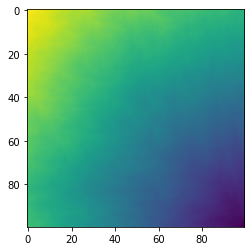

In [19]:
import matplotlib.pyplot as plt
plt.imshow(best_risk_from_bottom_right)

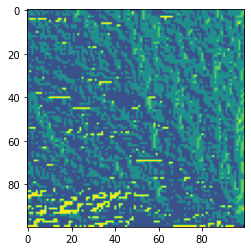

In [20]:
plt.imshow(best_dir)